In [2]:
! git clone https://github.com/Tessellate-Imaging/monk_v1.git

Cloning into 'monk_v1'...
remote: Enumerating objects: 773, done.
remote: Counting objects: 100% (773/773), done.
remote: Compressing objects: 100% (482/482), done.
remote: Total 773 (delta 349), reused 672 (delta 265), pack-reused 0
Receiving objects: 100% (773/773), 4.74 MiB | 3.54 MiB/s, done.
Resolving deltas: 100% (349/349), done.


In [ ]:
#For installation
! pip install -r monk_v1/installation/requirements_cpu.txt

In [1]:
import os
import sys
sys.path.append("monk_v1/monk/")

In [2]:
from gluon_prototype import prototype 

In [3]:
gtf = prototype(verbose=1);
gtf.Prototype("sample-project-1", "sample-experiment-1");

Mxnet Version: 1.5.1

Experiment Details
    Project: sample-project-1
    Experiment: sample-experiment-1
    Dir: /home/abhi/Desktop/Work/Study/Intel/git_resources/workspace/sample-project-1/sample-experiment-1/



## Download the intel image classification dataset from kaggle


    credits: https://www.kaggle.com/puneet6060/intel-image-classification

    Install kaggle client using: https://github.com/Kaggle/kaggle-api
        CMD: pip install -U kaggle



In [8]:
! kaggle datasets download -d puneet6060/intel-image-classification -q

In [9]:
! unzip -qq intel-image-classification.zip

In [10]:
os.listdir("./")

['.ipynb_checkpoints',
 'seg_pred',
 'seg_test',
 'monk_v1',
 'seg_train',
 'Effect of pretrained models on image classification.ipynb',
 'intel-image-classification.zip']

In [4]:
# Setup Dataset

gtf.Default(dataset_path=["seg_train/seg_train/", "seg_test/seg_test/"], 
            model_name="resnet18_v1", freeze_base_network=True, num_epochs=2);

Dataset Details
    Train path:     seg_train/seg_train/
    Val path:       seg_test/seg_test/
    CSV train path: None
    CSV val path:  None

Dataset Params
    Input Size:  224
    Batch Size:  4
    Data Shuffle: True
    Processors:   4

Pre-Composed Train Transforms
[{'RandomHorizontalFlip': {'p': 0.8}}, {'Normalize': {'mean': [0.485, 0.456, 0.406], 'std': [0.229, 0.224, 0.225]}}]

Pre-Composed Val Transforms
[{'RandomHorizontalFlip': {'p': 0.8}}, {'Normalize': {'mean': [0.485, 0.456, 0.406], 'std': [0.229, 0.224, 0.225]}}]

Dataset Numbers
    Num train images: 14034
    Num val images:   3000
    Num classes:      6

Model Params
    Model name:           resnet18_v1
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           resnet18_v1
        Num layers in model:  51
        Num trainable layers: 1

Optimizer
    Name:          sgd
    Learn

In [31]:
# List Available models
gtf.List_Models();

Models List: 
    1. alexnet
    2. darknet53
    3. densenet121
    4. densenet161
    5. densenet169
    6. densenet201
    7. inceptionv3
    8. mobilenet1.0
    9. mobilenet0.75
    10. mobilenet0.25
    11. mobilenet0.5
    12. resnet18_v1
    13. resnet34_v1
    14. resnet50_v1
    15. resnet101_v1
    16. resnet152_v1
    17. resnext50_32x4d
    18. resnext101_32x4d
    19. resnext101_64x4d_v1
    20. se_resnext50_32x4d
    21. se_resnext101_32x4d
    22. se_resnext101_64x4d
    23. senet_154
    24. vgg11
    25. vgg13
    26. vgg16
    27. vgg19
    28. vgg11_bn
    29. vgg13_bn
    30. vgg16_bn
    31. vgg19_bn
    32. resnet18_v2
    33. resnet34_v2
    34. resnet50_v2
    35. resnet101_v2
    36. resnet152_v2
    37. mobilenetv2_1.0
    38. mobilenetv2_0.75
    39. mobilenetv2_0.5
    40. mobilenetv2_0.25
    41. squeezenet1.0
    42. squeezenet1.1
    43. mobilenetv3_large
    44. mobilenetv3_small
    45. resnet18_v1b
    46. resnet34_v1b
    47. resnet50_v1b
    48. resn

# AlexNet

In [32]:
gtf.Model_Params(model_name="alexnet", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           alexnet
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           alexnet
        Num layers in model:  8
        Num trainable layers: 2



In [34]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


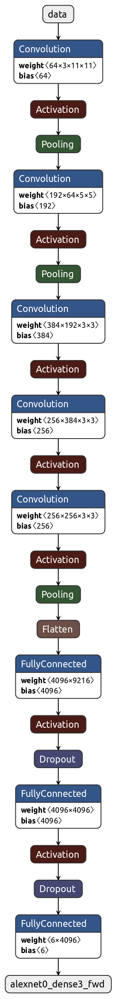

In [35]:
from IPython.display import Image
Image(filename='Models/alexnet.png')

# VGGNet

In [36]:
gtf.Model_Params(model_name="vgg16", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           vgg16
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model


100%|██████████| 500159/500159 [00:21<00:00, 23550.92KB/s]


    Model Loaded on device
        Model name:           vgg16
        Num layers in model:  16
        Num trainable layers: 3



In [39]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


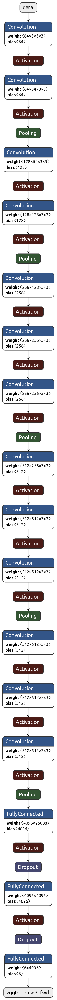

In [40]:
from IPython.display import Image
Image(filename='Models/vgg16.png')

# Resnet 18

In [19]:
gtf.Model_Params(model_name="resnet18_v1", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           resnet18_v1
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           resnet18_v1
        Num layers in model:  51
        Num trainable layers: 1



In [28]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


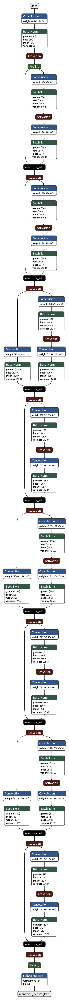

In [27]:
from IPython.display import Image
Image(filename='Models/resnet_18.png')

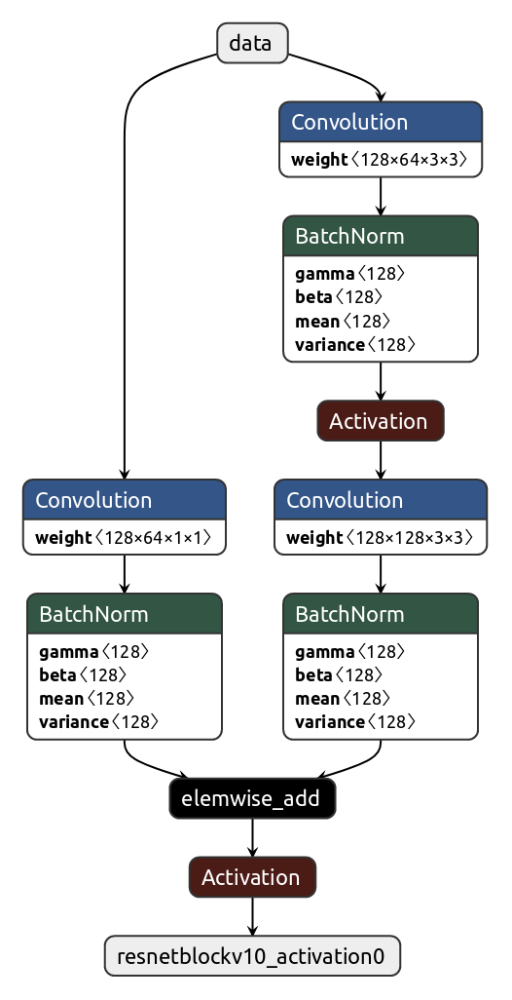

In [29]:
# Resnet blocks 
from IPython.display import Image
Image(filename='Models/resnet_block_v1_with_downsampling.png')

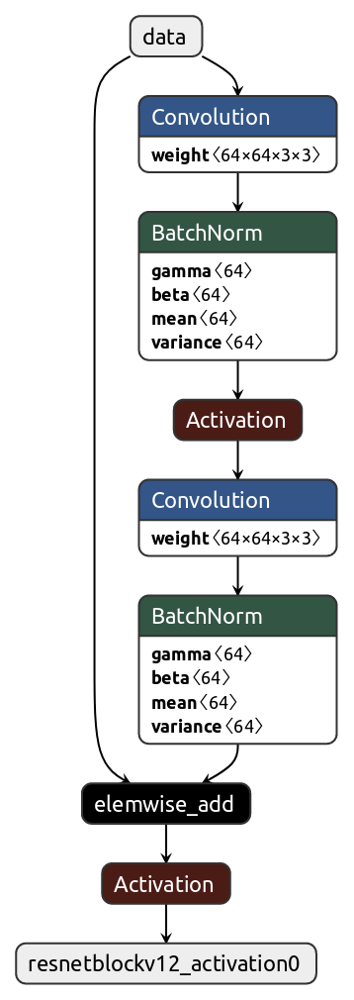

In [30]:
# Resnet blocks 
from IPython.display import Image
Image(filename='Models/resnet_block_v1_without_downsampling.png')

In [ ]:
# MobileNet V2

In [41]:
gtf.Model_Params(model_name="mobilenetv2_1.0", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           mobilenetv2_1.0
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           mobilenetv2_1.0
        Num layers in model:  131
        Num trainable layers: 4



In [42]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


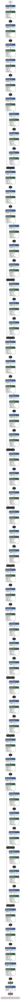

In [43]:
from IPython.display import Image
Image(filename='Models/mobilenetv2.png')

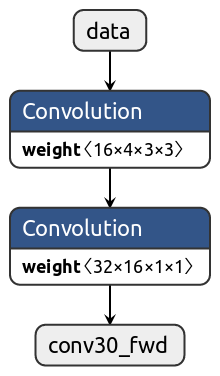

In [44]:
# Separable conv
from IPython.display import Image
Image(filename='Models/separable_conv.png')

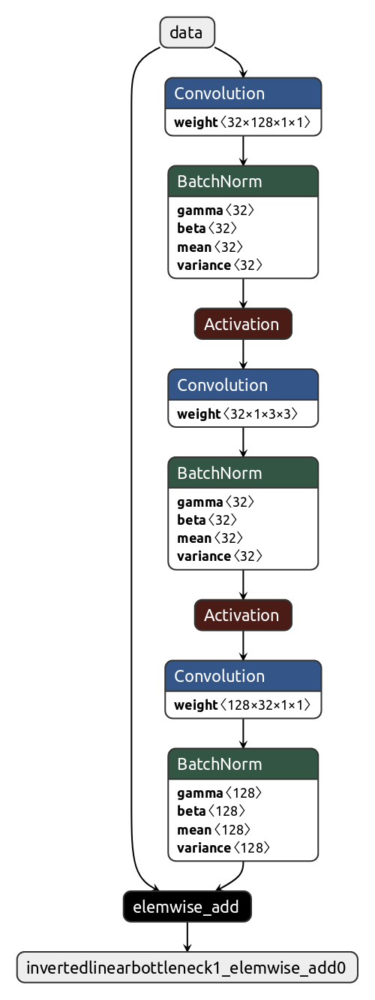

In [71]:
# Inverted residual block
from IPython.display import Image
Image(filename='Models/inverted_linear_bottleneck.png')

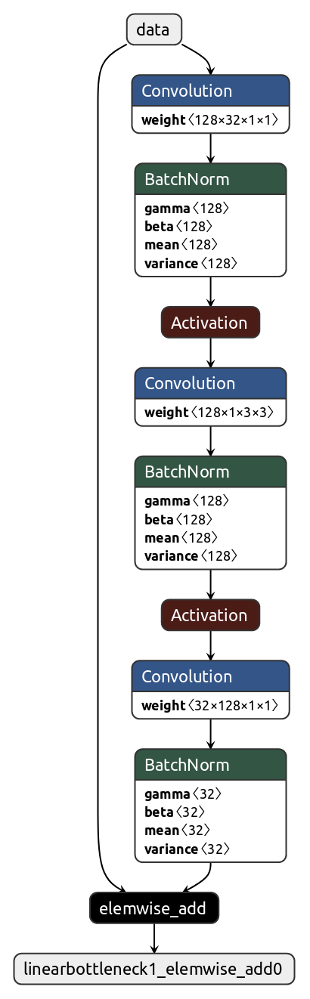

In [72]:
# Inverted residual block
from IPython.display import Image
Image(filename='Models/linear_bottleneck.png')

# SqueezeNet 1.0

In [45]:
gtf.Model_Params(model_name="squeezenet1.0", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           squeezenet1.0
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           squeezenet1.0
        Num layers in model:  26
        Num trainable layers: 5



In [46]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


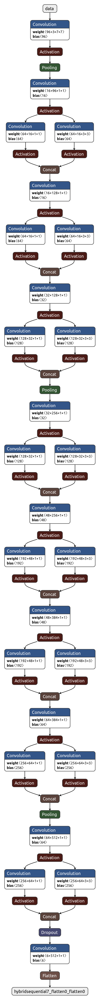

In [47]:
from IPython.display import Image
Image(filename='Models/squeezenet1.0.png')

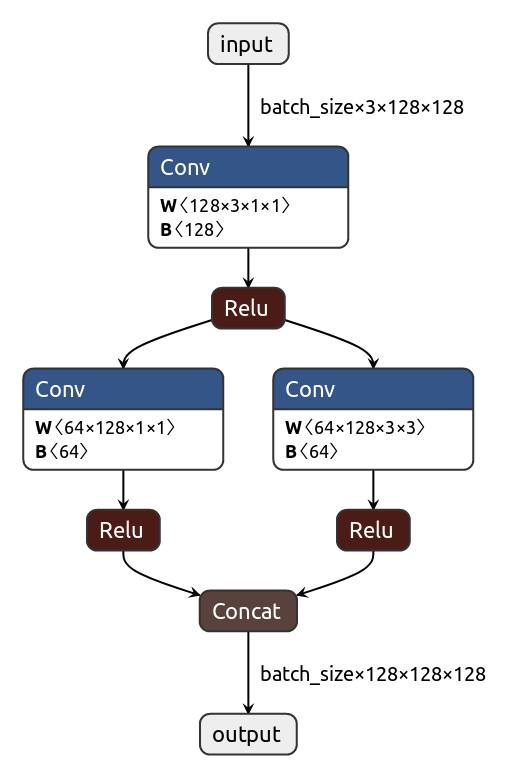

In [48]:
#Fire block
from IPython.display import Image
Image(filename='Models/fire.png')

# ResNext - 50

In [49]:
gtf.Model_Params(model_name="resnext50_32x4d", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           resnext50_32x4d
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           resnext50_32x4d
        Num layers in model:  133
        Num trainable layers: 6



In [50]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


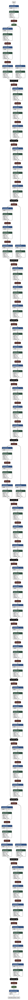

In [53]:
from IPython.display import Image
Image(filename='Models/resnext-50.png')

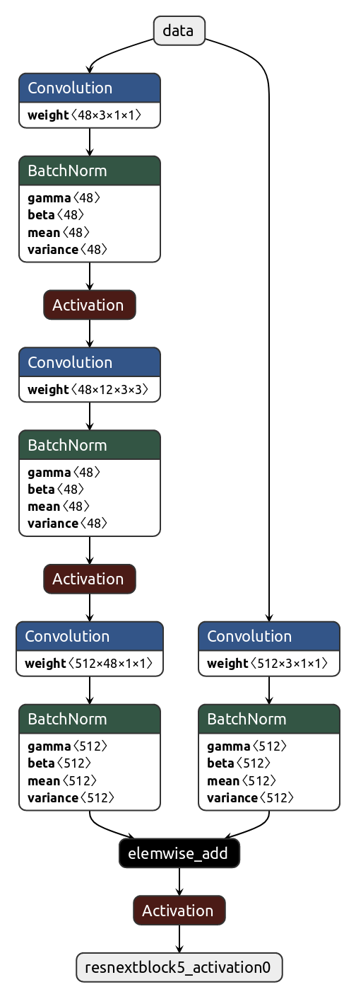

In [54]:
# Resnext blocks - Type -1
#SE - Squeze Excitation block
from IPython.display import Image
Image(filename='Models/resnext_block_with_downsampling_without_se.png')

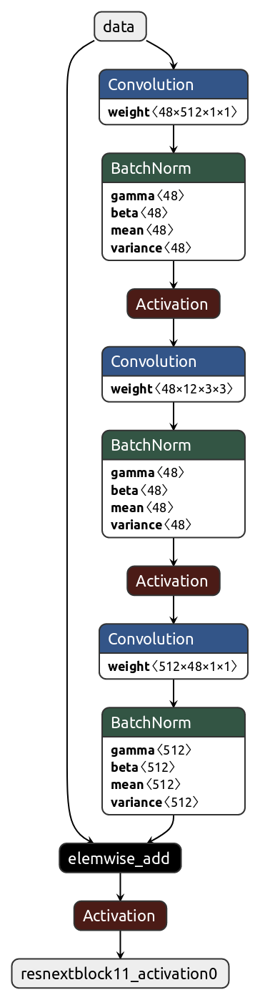

In [55]:
# Resnext blocks - Type - 2
#SE - Squeze Excitation block
from IPython.display import Image
Image(filename='Models/resnext_block_without_downsampling_without_se.png')

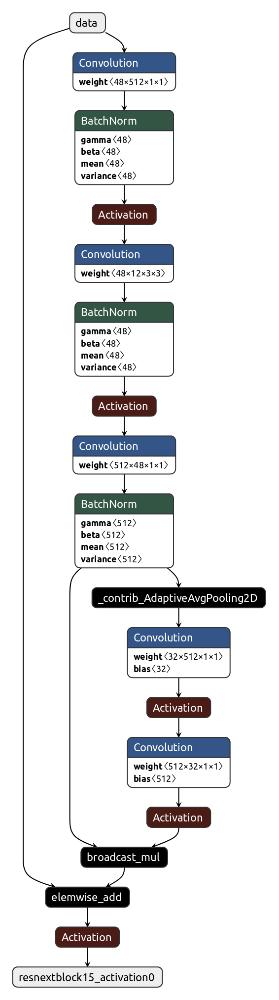

In [56]:
# Resnext blocks - Type - 3
#SE - Squeze Excitation block
from IPython.display import Image
Image(filename='Models/resnext_block_without_downsampling_with_se.png')

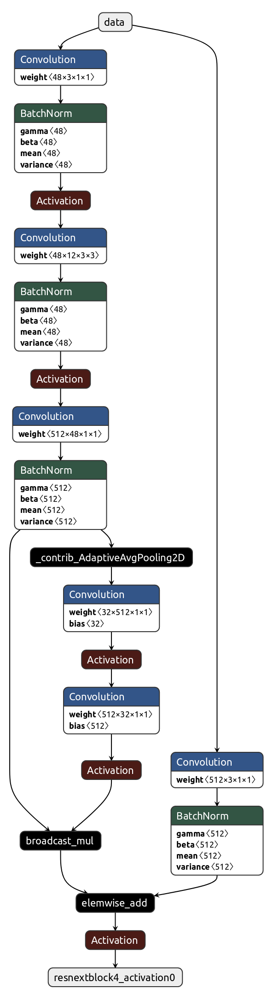

In [57]:
# Resnext blocks - Type - 4
#SE - Squeze Excitation block
from IPython.display import Image
Image(filename='Models/resnext_block_with_downsampling_with_se.png')

# Inception

In [59]:
gtf.Model_Params(model_name="inceptionv3", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           inceptionv3
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           inceptionv3
        Num layers in model:  236
        Num trainable layers: 7



In [62]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 299, 299)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


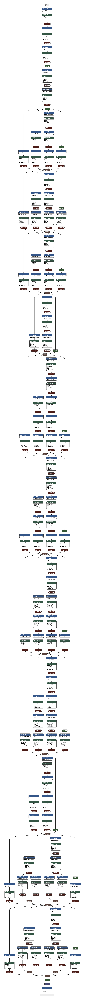

In [64]:
from IPython.display import Image
Image(filename='Models/inception.png')

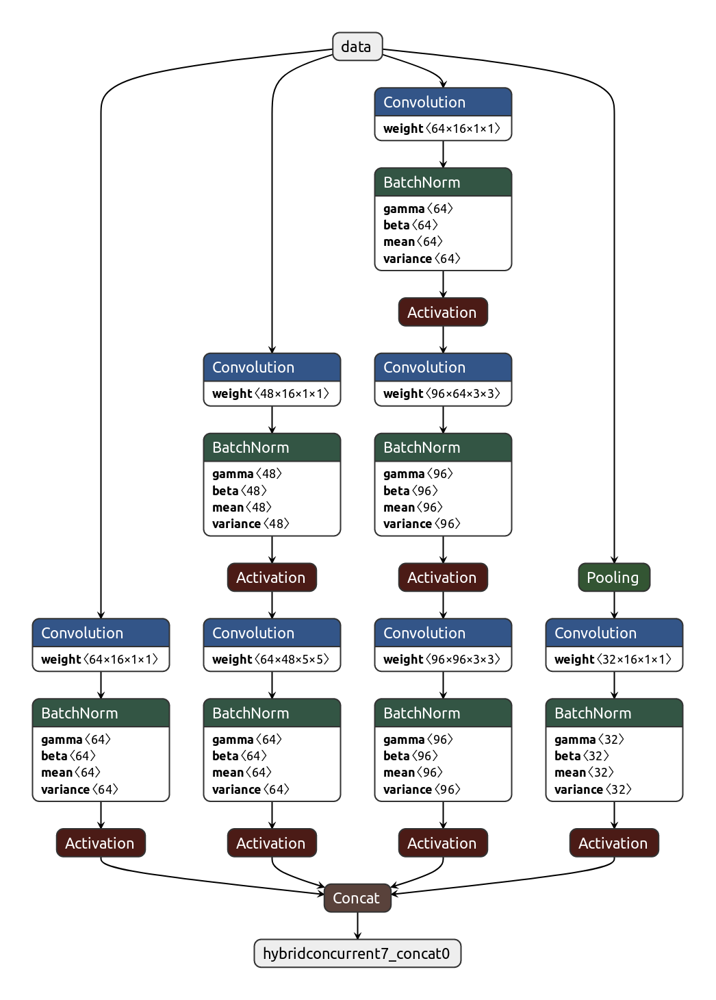

In [66]:
#Inception Blocks - Type 1
from IPython.display import Image
Image(filename='Models/inception_a.png')

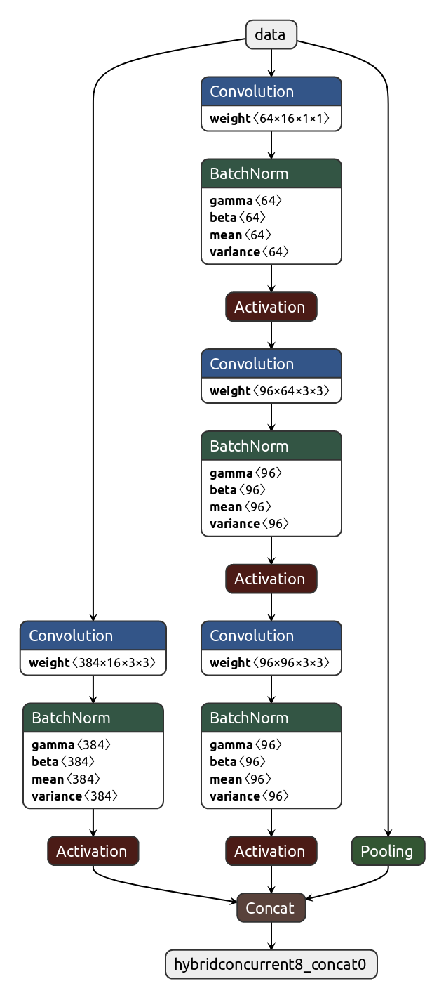

In [67]:
#Inception Blocks - Type 2
from IPython.display import Image
Image(filename='Models/inception_b.png')

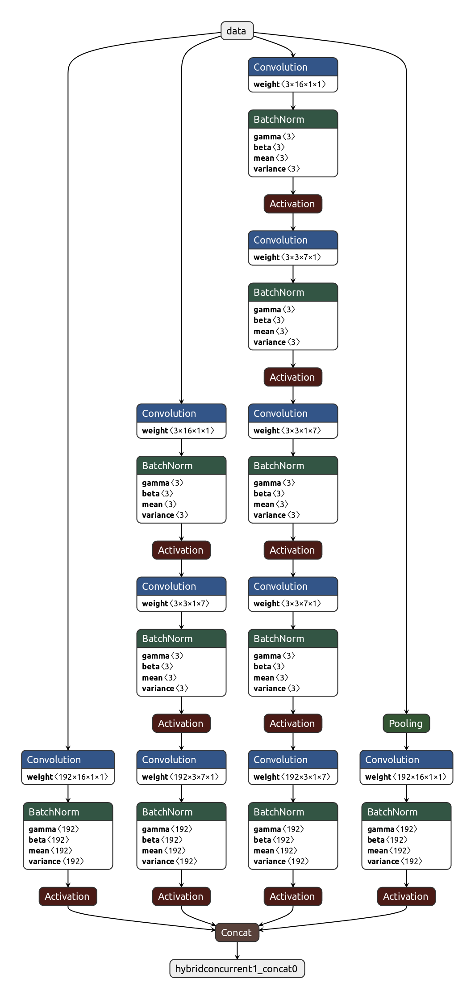

In [68]:
#Inception Blocks - Type 3
from IPython.display import Image
Image(filename='Models/inception_c.png')

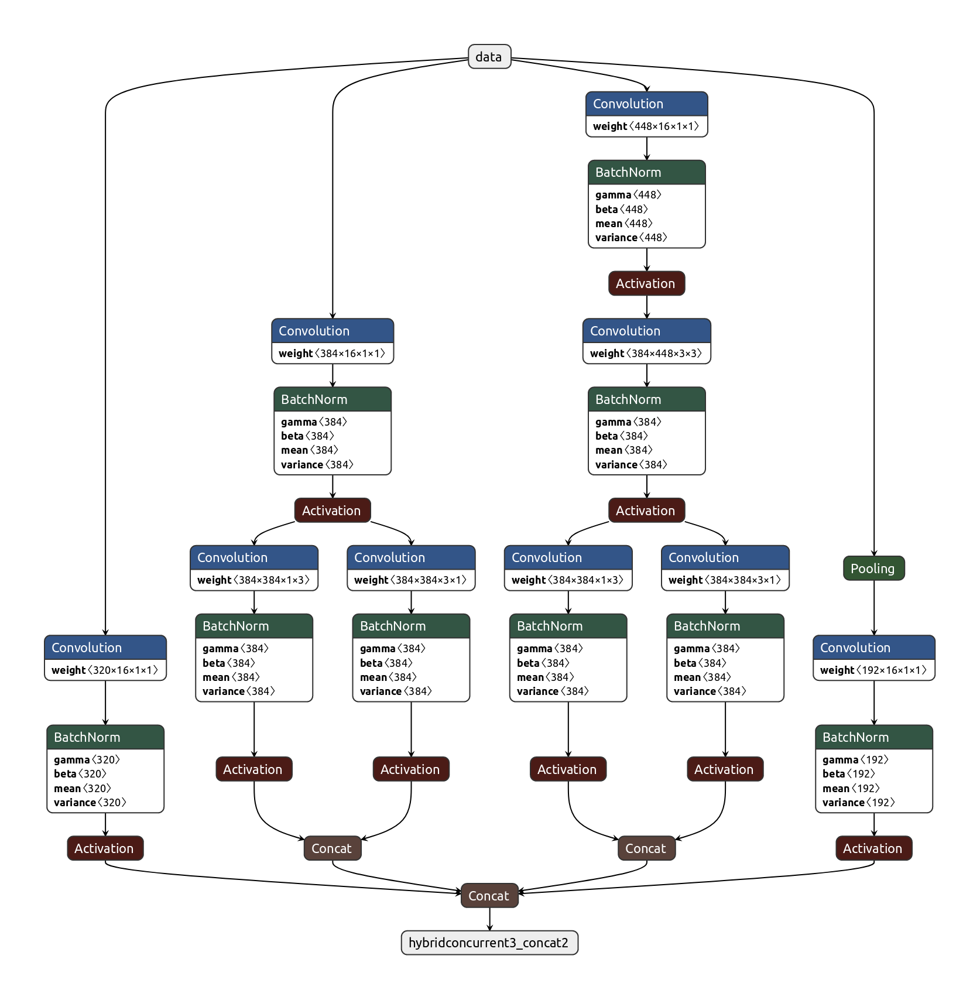

In [69]:
#Inception Blocks - Type 4
from IPython.display import Image
Image(filename='Models/inception_e.png')

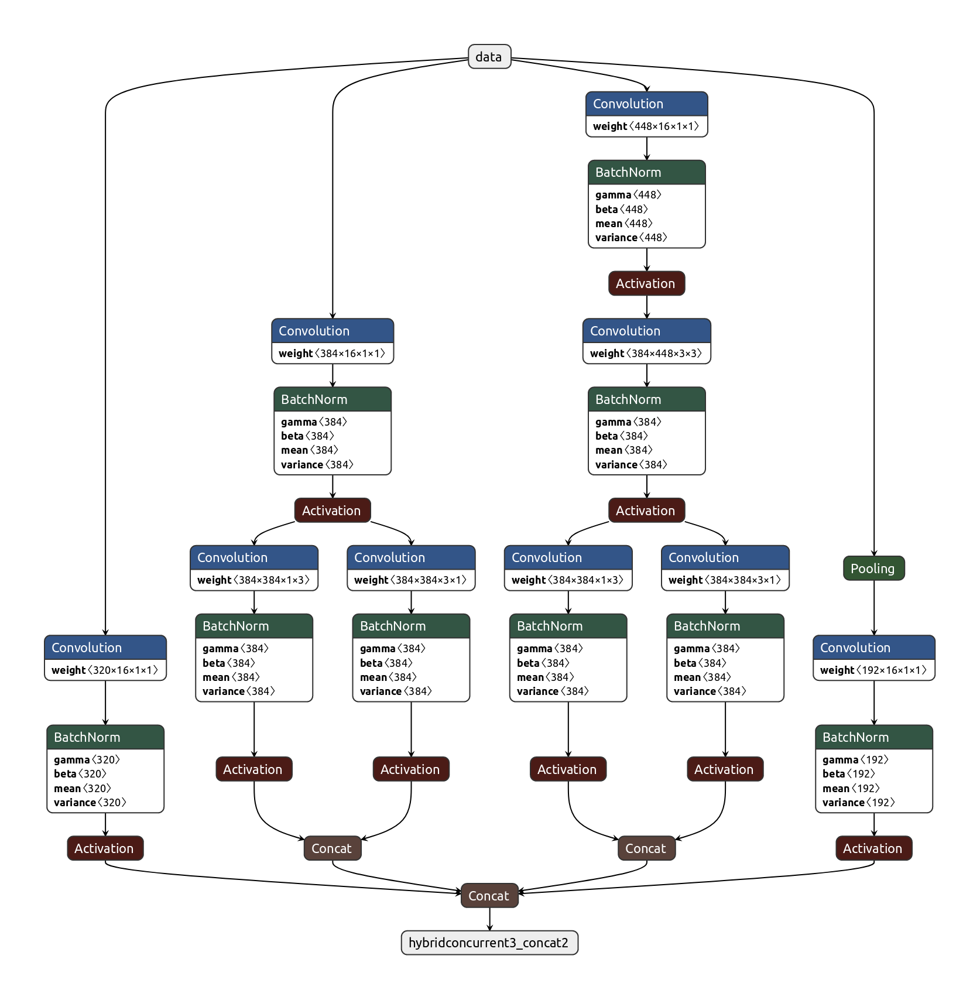

In [70]:
#Inception Blocks - Type 5
from IPython.display import Image
Image(filename='Models/inception_e.png')

# Densenet-121

In [73]:
gtf.Model_Params(model_name="densenet121", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           densenet121
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           densenet121
        Num layers in model:  303
        Num trainable layers: 8



In [74]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


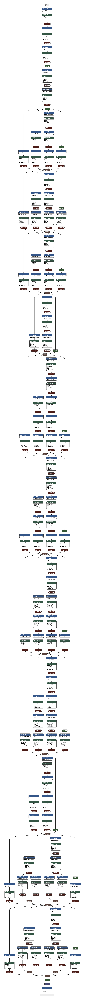

In [78]:
from IPython.display import Image
Image(filename='Models/inception.png')

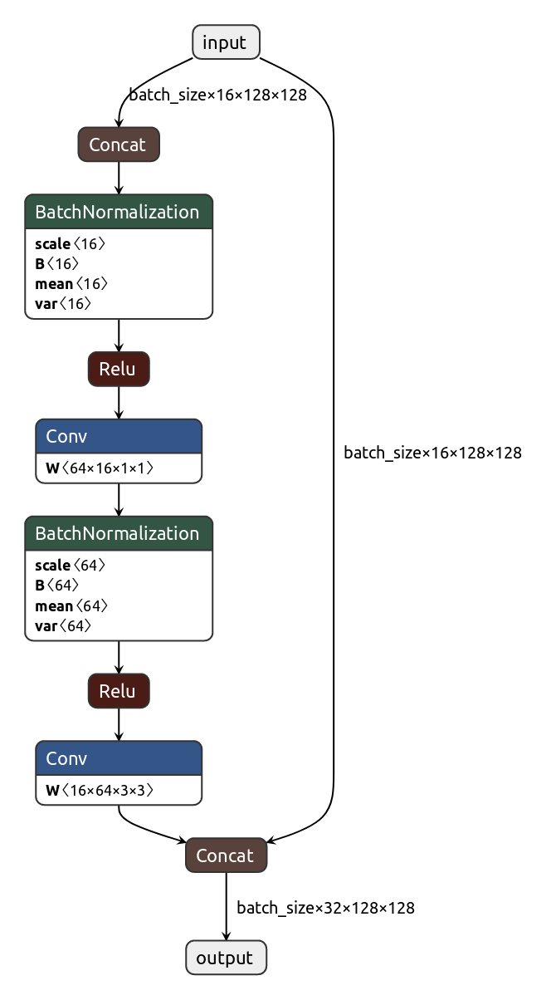

In [75]:
#Dense Block
from IPython.display import Image
Image(filename='Models/dense_block.png')

# Squeeze Excitation Network

In [76]:
gtf.Model_Params(model_name="senet_154", freeze_base_network=True, use_gpu=True, use_pretrained=True);
gtf.Model();

Model Params
    Model name:           senet_154
    Use Gpu:              True
    Use pretrained:       True
    Freeze base network:  True

Model Details
    Loading pretrained model
    Model Loaded on device
        Model name:           senet_154
        Num layers in model:  493
        Num trainable layers: 9



In [80]:
#invoking an internal function to save a model for visualization using netron
import mxnet as mx
data = mx.nd.random.randn(1, 3, 224, 224)
data = data.copyto(mx.gpu(0))

gtf.system_dict["local"]["model"].hybridize();
out = gtf.system_dict["local"]["model"](data)

gtf.system_dict["local"]["model"].export("model", epoch=0)

import netron
netron.start('model-symbol.json')
#Starts a server


Stopping http://localhost:8080
Serving 'model-symbol.json' at http://localhost:8080


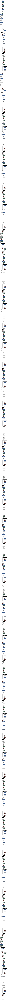

In [79]:
from IPython.display import Image
Image(filename='Models/senet_154.png')

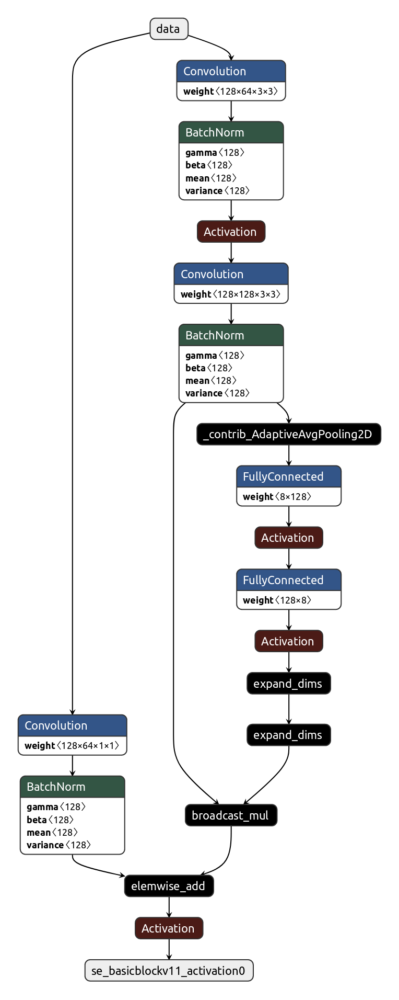

In [81]:
#SE V1-Blobs - Type 1
from IPython.display import Image
Image(filename='Models/senet_block_v1_with_downsampling.png')

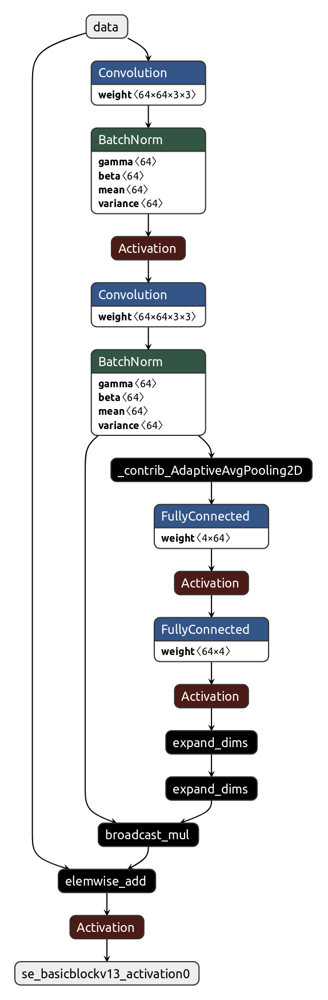

In [84]:
#SE V1-Blobs - Type 2
from IPython.display import Image
Image(filename='Models/senet_block_v1_without_downsampling.png')

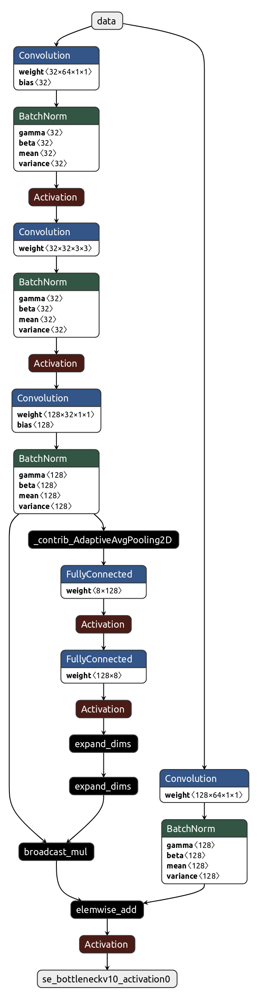

In [85]:
#SE V1-Blobs - Type 3
from IPython.display import Image
Image(filename='Models/senet_bottleneck_block_v1_with_downsampling.png')

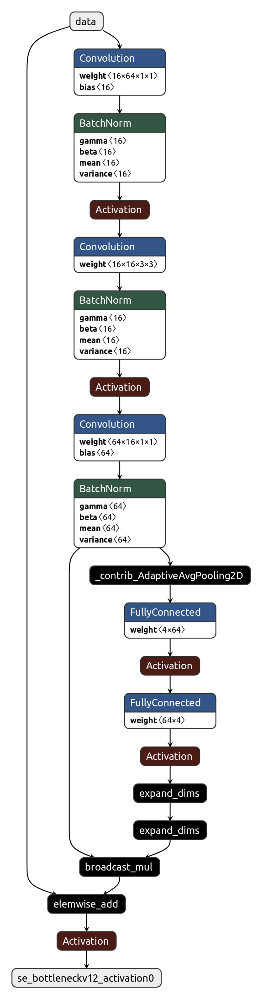

In [86]:
#SE V1-Blobs - Type 4
from IPython.display import Image
Image(filename='Models/senet_bottleneck_block_v1_without_downsampling.png')

## Analysing the effect of few pretrained models on the intel dataset while fintuning

In [6]:
# Analysis Project Name
analysis_name = "analyse_models";

# Models to analyse
# First element in the list- Model Name
# Second element in the list - Boolean value to freeze base network or not
# Third element in the list - Boolean value to use pretrained model as the starting point or not
models = [["alexnet", True, True], ["resnet18_v2", True, True], ["resnet18_v1", True, True],
         ["resnext50_32x4d", True, True]];  

epochs=10;

# Percentage of original dataset to take in for experimentation
percent_data=30;

# "keep_all" - Keep all the sub experiments created
# "keep_non" - Delete all sub experiments created
analysis = gtf.Analyse_Models(analysis_name, models, percent_data, num_epochs=epochs, state="keep_none"); 


Running Model analysis
Analysis Name      : analyse_models

Running experiment : 1/4
Experiment name    : Model_alexnet_freeze_base_pretrained
Estimated time     : 2 min
Experiment Complete


Running experiment : 2/4
Experiment name    : Model_resnet18_v2_freeze_base_pretrained
Estimated time     : 2 min
Experiment Complete


Running experiment : 3/4
Experiment name    : Model_resnet18_v1_freeze_base_pretrained
Estimated time     : 2 min
Experiment Complete


Running experiment : 4/4
Experiment name    : Model_resnext50_32x4d_freeze_base_pretrained
Estimated time     : 6 min
Experiment Complete


Comparing Experiments
Comparison ID:      Comparison_analyse_models
Generated statistics post all epochs
| Experiment Name                              |   Train Acc |   Val Acc |   Train Loss |   Val Loss |
|----------------------------------------------+-------------+-----------+--------------+------------|
| Model_alexnet_freeze_base_pretrained         |    0.886644 |  0.861915 |     1.429

<Figure size 432x288 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

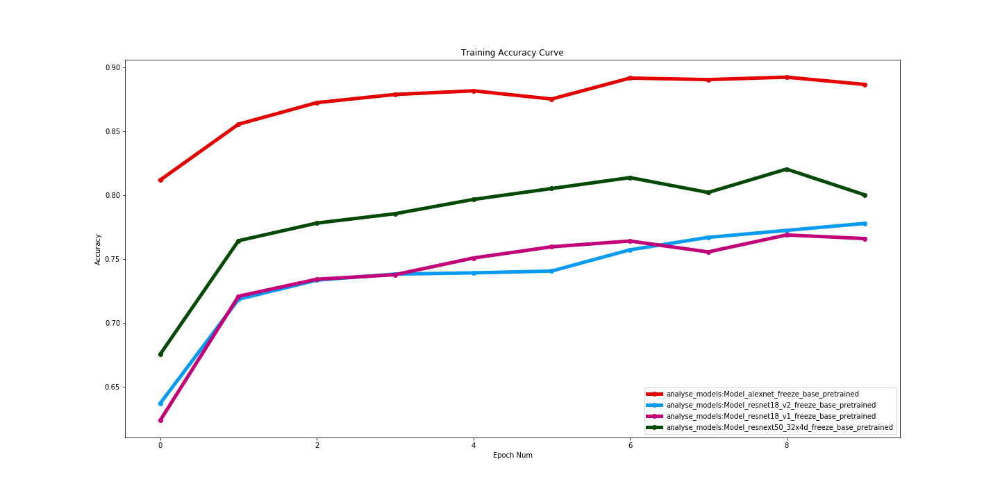

In [13]:
# Train Accuracies
from IPython.display import Image
Image(filename='Models/train_accuracy.png')

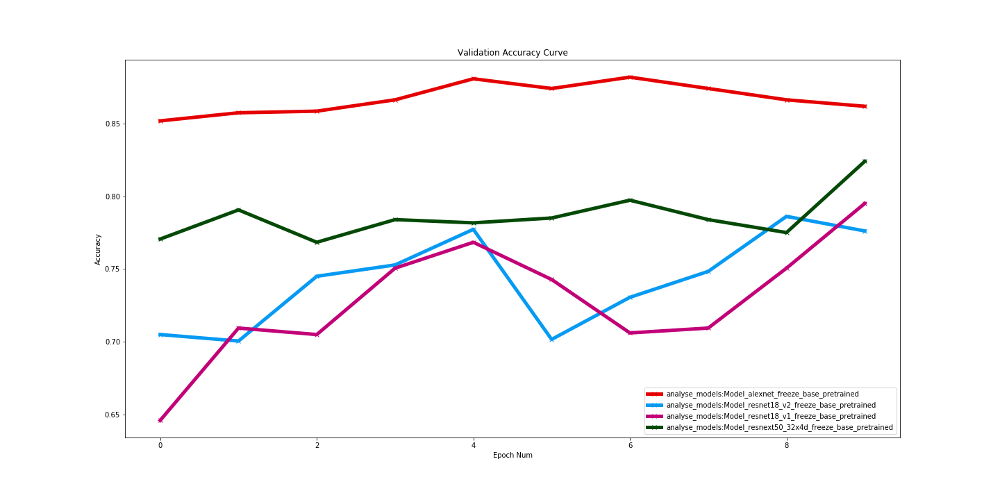

In [14]:
# Val Accuracies
from IPython.display import Image
Image(filename='Models/val_accuracy.png')

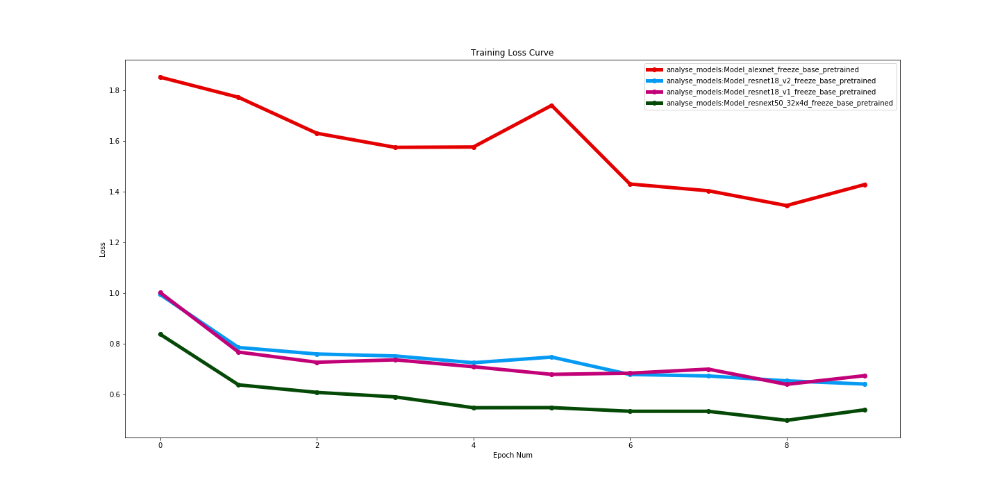

In [15]:
# Train Losses
from IPython.display import Image
Image(filename='Models/train_loss.png')

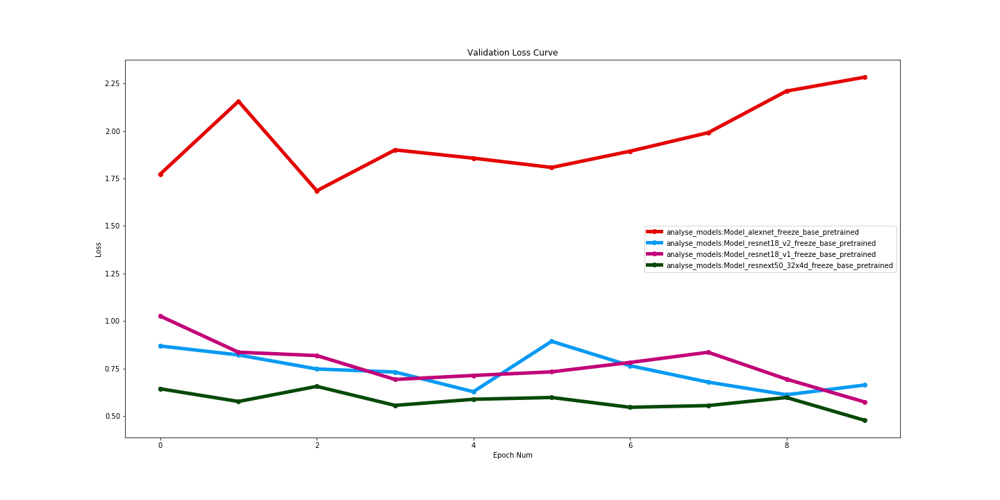

In [16]:
# Val Losses
from IPython.display import Image
Image(filename='Models/val_loss.png')

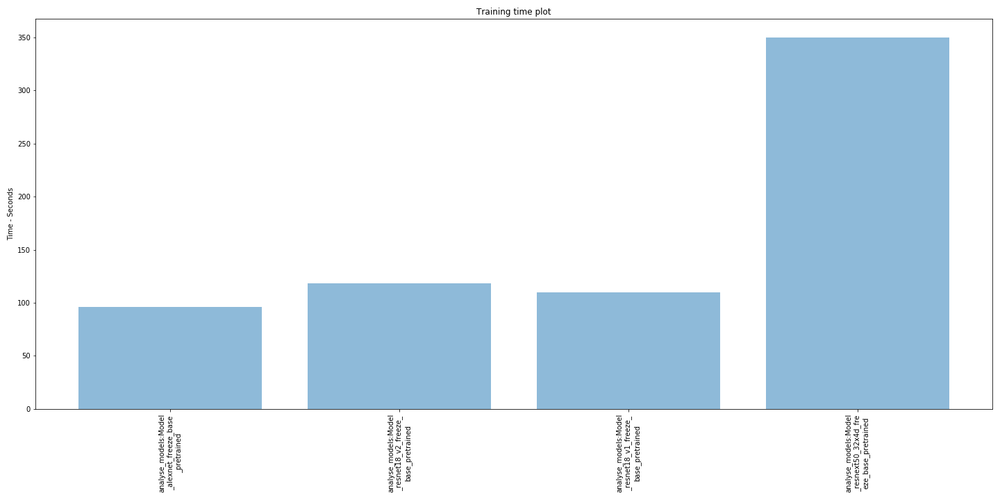

In [17]:
# Train time
from IPython.display import Image
Image(filename='Models/stats_training_time.png')